# Explore GRS images

## Load python libraries

In [2]:

import glob
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import xarray as xr
import rioxarray  # activate the rio accessor
from shapely.geometry import box
import datetime as dt

import hvplot.xarray
import pyproj as ppj

#import cartopy
import cartopy.crs as ccrs
#import cartopy.feature as cfeature
#import locale
#locale.setlocale(locale.LC_ALL, 'en_US.utf8')
import matplotlib.pyplot as plt
import matplotlib as mpl
#mpl.use('TkAgg')


plt.rcParams.update({'font.family': 'Times New Roman',
                     'font.size': 16, 'axes.labelsize': 18,

                     })

rc = {"font.family" : "serif",
      "mathtext.fontset" : "stix"}
plt.rcParams.update(rc)
plt.rcParams["font.serif"] = ["Times New Roman"] + plt.rcParams["font.serif"]

import panel as pn

import grs
import grstbx
from grstbx import visual


u = grstbx.utils
opj = os.path.join


print(f'-grs: {grs.__version__}')
print(f'-grstbx: {grstbx.__version__}')

-grs: 2.2.0
-grstbx: 2.0.2


## Create datacube

In [4]:

tile =  '32TLP'
clon,clat = 6.81,43.586 
site ='CASSIEN83'
height,width=6500,6500
site='CASSIEN83'
rootdir ='/data/satellite/Sentinel-2/subset/L2B/'
dcdir = '/data/satellite/Sentinel-2/subset/datacube/'
tile=site
suffix='_matchup'
start_year,end_year=2018,2024

In [5]:
# subset from center location and width/height


ust = grstbx.SpatioTemp()
box = ust.wktbox(clon, clat, width=width, height=height, ellps='WGS84')
bbox = gpd.GeoSeries.from_wkt([box]).set_crs(epsg=4326)

In [6]:
pattern='*'
datadir = opj(rootdir, tile, '*', '*', '*', pattern)#,'*[0-9].nc')
list_files = glob.glob(datadir)
list_files
file_labels=['satellite','level','time','baseline','orbit','tile','processing_time']
indexes = ['time','satellite','tile','level','baseline','orbit','processing_time']
basenames = pd.Series([os.path.basename(p) for p in list_files])  # ,columns=['basename']) #basenames
df = basenames.str.split('_', expand=True)
df.columns=file_labels
df['path']=list_files
df['time'] = pd.to_datetime(df['time'])
df=df.set_index(indexes).sort_index(level=0)
df

,,,,,,,path
time,satellite,tile,level,baseline,orbit,processing_time,
2023-01-04 10:33:29,S2B,T32TLP,MSIL2B,N0509,R108,20230104T110718.nc,/data/satellite/Sentinel-2/subset/L2B/CASSIEN8...
2023-01-06 10:24:11,S2A,T32TLP,MSIL2B,N0509,R065,20230106T122023.nc,/data/satellite/Sentinel-2/subset/L2B/CASSIEN8...
2023-01-09 10:34:21,S2A,T32TLP,MSIL2B,N0509,R108,20230109T141018.nc,/data/satellite/Sentinel-2/subset/L2B/CASSIEN8...
2023-01-19 10:33:41,S2A,T32TLP,MSIL2B,N0509,R108,20230119T140921.nc,/data/satellite/Sentinel-2/subset/L2B/CASSIEN8...
2023-01-21 10:22:39,S2B,T32TLP,MSIL2B,N0509,R065,20230121T105647.nc,/data/satellite/Sentinel-2/subset/L2B/CASSIEN8...
...,...,...,...,...,...,...,...
2023-12-17 10:23:39,S2B,T32TLP,MSIL2B,N0510,R065,20231217T122050.nc,/data/satellite/Sentinel-2/subset/L2B/CASSIEN8...
2023-12-22 10:24:31,S2A,T32TLP,MSIL2B,N0510,R065,20231222T122300.nc,/data/satellite/Sentinel-2/subset/L2B/CASSIEN8...
2023-12-25 10:34:41,S2A,T32TLP,MSIL2B,N0510,R108,20231225T123013.nc,/data/satellite/Sentinel-2/subset/L2B/CASSIEN8...


In [7]:
start_date='2018-01-01'
end_date='2024-12-31'
files = df[start_date:end_date].values.ravel()
dc_path=opj(dcdir,tile+f'_{start_date}_{end_date}'+suffix+'.nc')
if not os.path.exists(dc_path):
    dc = grstbx.L2grs(files)
    dc.get_l2b_datacube(subset=bbox)
    
    #dc.datacube.to_netcdf(dc_path)

In [9]:
#dcube=xr.open_dataset(dc_path,decode_coords='all')
dcube

<xarray.Dataset> Size: 4GB
Dimensions:                 (time: 102, y: 665, x: 665)
Coordinates:
  * time                    (time) datetime64[ns] 816B 2023-01-04T10:33:29 .....
  * x                       (x) float64 5kB 3.166e+05 3.166e+05 ... 3.298e+05
    band                    int64 8B 1
    spatial_ref             int64 8B 0
  * y                       (y) float64 5kB 4.835e+06 4.835e+06 ... 4.822e+06
Data variables: (12/14)
    owt_dist_Spyrakos2018   (time, y, x) float64 361MB nan nan nan ... nan nan
    owt_index_Spyrakos2018  (time, y, x) float64 361MB nan nan nan ... nan nan
    owt_dist_Bi2024         (time, y, x) float64 361MB nan nan nan ... nan nan
    owt_index_Bi2024        (time, y, x) float64 361MB nan nan nan ... nan nan
    Chla_OC2nasa            (time, y, x) float64 361MB nan nan nan ... nan nan
    Chla_M09B               (time, y, x) float64 361MB nan nan nan ... nan nan
    ...                      ...
    SPM_nechad              (time, y, x) float64 361MB nan nan nan ... nan nan
    acdom_B15               (time, y, x) float64 361MB nan nan nan ... nan nan
    Kd_par                  (time, y, x) float64 361MB nan nan nan ... nan nan
    flags                   (time, y, x) int64 361MB 518 646 646 ... 522 522 514
    mask                    (time, y, x) uint8 45MB 1 1 1 1 1 1 ... 1 1 1 1 1 1
    valid_pix_prop          (time) float64 816B 0.3369 0.02065 ... 0.3865 0.4087
Attributes: (12/74)
    long_name:                           CA BLUE GREEN RED VRE_1 VRE_2 VRE_3 ...
    constellation:                       Sentinel-2
    constellation_id:                    S2
    product_path:                        /data/satellite/Sentinel-2/L1C/32TLP...
    product_name:                        S2B_MSIL1C_20230104T103329_N0509_R10...
    product_filename:                    S2B_MSIL1C_20230104T103329_N0509_R10...
    ...                                  ...
    dirdata:                             /data/grs/grsdata
    abs_gas_file:                        /home/harmel/Dropbox/Dropbox/work/gi...
    water_vapor_transmittance_file:      /home/harmel/Dropbox/Dropbox/work/gi...
    metadata_profile:                    datacube
    start_date:                          2023-01-04T10:33:29.000000000
    stop_date:                           2023-12-30T10:33:49.000000000

In [8]:
dcube=dc.datacube
alpha=0.8
plt.figure(figsize=(24,5))
dcube.flag_opac_cirrus.plot(marker="o",ms=3,alpha=alpha,label='opaque cirrus')
dcube.flag_cloud_p06.plot(marker="o",ms=3,alpha=alpha,label='Cloud P06')
dcube.flag_water_swir_visible_index.plot(marker="o",ms=3,alpha=alpha,label='HiSWIR')
plt.legend()

AttributeError: 'numpy.float64' object has no attribute 'plot'

<Figure size 2400x500 with 0 Axes>

In [ ]:
plt.figure(figsize=(24,5))
#dc.datacube.mean_solar_azimuth.plot()
dcube.mean_solar_zenith_angle.plot(marker="o",ms=3,alpha=alpha,label='SZA (deg)')



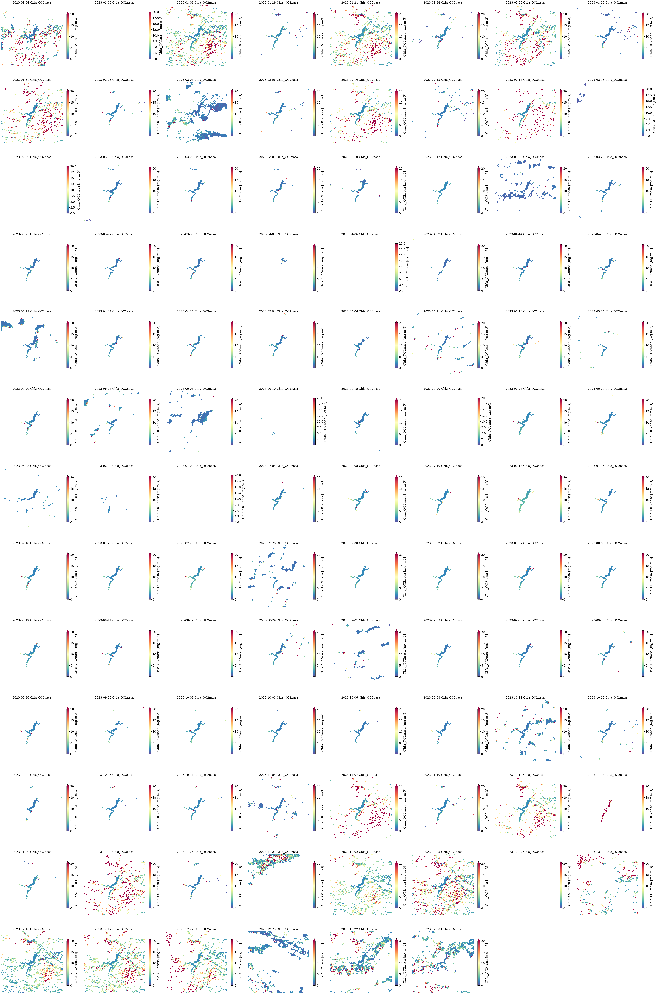

In [13]:
#dcube = dc.datacube
param='Chla_OC2nasa'
ncols=8


str_epsg = str(dcube.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)
alpha=0.5
dates = dcube.time

Ndates = len(dates)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*7,7*nrows+2.5),subplot_kw={'projection': proj}) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.05, wspace=0.07,)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs=axs.ravel()
[axi.set_axis_off() for axi in axs]

for ii,date in enumerate(dates):
    raster = dcube.sel(time=date)
    if 'time' in raster.dims:
        raster=raster.mean('time')
   
  
    date_ = date.dt.strftime('%Y-%m-%d').values
    #print(date_)
    #dem_attrs = grstbx.Dem.compute_dem_attributes(dem,sza,azi)
    #dem_attrs.shaded.plot.imshow(ax=axs[ii],robust=True,cmap=plt.cm.Greys_r,vmax=0.75,add_colorbar=False)#,cbar_kwargs={'shrink':0.4})
    
    raster[param].where(raster.mask==0).plot.imshow(ax=axs[ii],vmin=0,vmax=20,cmap=plt.cm.Spectral_r, robust=True,cbar_kwargs={'shrink':0.64})
   
    axs[ii].set_title(date_+' '+param,fontsize=16)


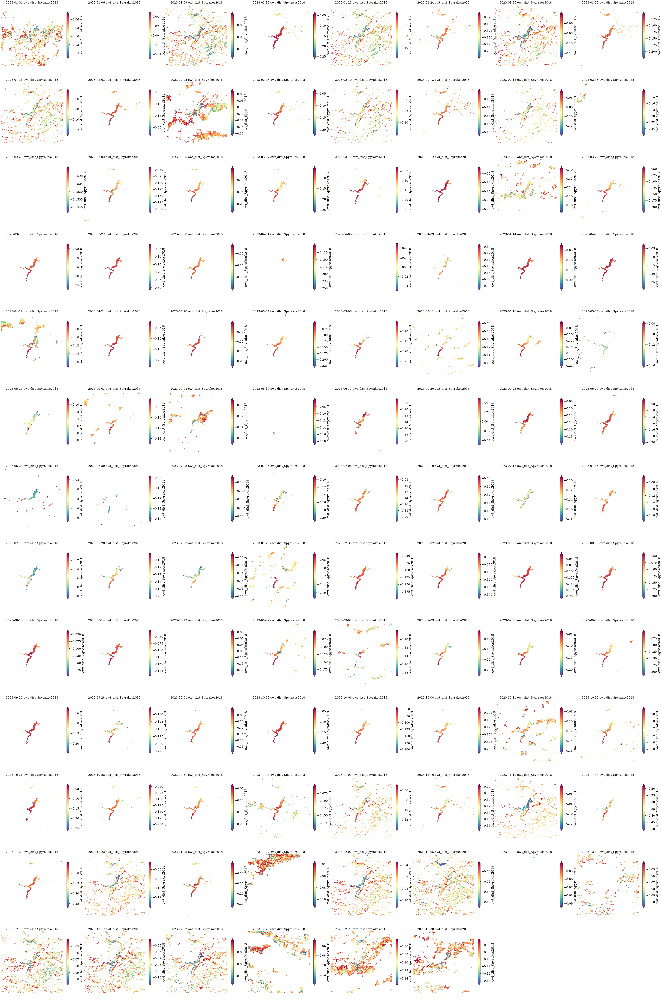

In [17]:
#dcube = dc.datacube
param='owt_dist_Spyrakos2018'
ncols=8


str_epsg = str(dcube.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)
alpha=0.5
dates = dcube.time

Ndates = len(dates)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*7,7*nrows+2.5),subplot_kw={'projection': proj}) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.05, wspace=0.07,)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs=axs.ravel()
[axi.set_axis_off() for axi in axs]

for ii,date in enumerate(dates):
    raster = dcube.sel(time=date)
    if 'time' in raster.dims:
        raster=raster.mean('time')
   
  
    date_ = date.dt.strftime('%Y-%m-%d').values
    #print(date_)
    #dem_attrs = grstbx.Dem.compute_dem_attributes(dem,sza,azi)
    #dem_attrs.shaded.plot.imshow(ax=axs[ii],robust=True,cmap=plt.cm.Greys_r,vmax=0.75,add_colorbar=False)#,cbar_kwargs={'shrink':0.4})
    
    raster[param].where(raster.mask==0).plot.imshow(ax=axs[ii],cmap=plt.cm.Spectral_r, robust=True,cbar_kwargs={'shrink':0.64})
   
    axs[ii].set_title(date_+' '+param,fontsize=16)


In [14]:
dcube

<xarray.Dataset> Size: 4GB
Dimensions:                 (time: 102, y: 665, x: 665)
Coordinates:
  * time                    (time) datetime64[ns] 816B 2023-01-04T10:33:29 .....
  * x                       (x) float64 5kB 3.166e+05 3.166e+05 ... 3.298e+05
    band                    int64 8B 1
    spatial_ref             int64 8B 0
  * y                       (y) float64 5kB 4.835e+06 4.835e+06 ... 4.822e+06
Data variables: (12/14)
    owt_dist_Spyrakos2018   (time, y, x) float64 361MB nan nan nan ... nan nan
    owt_index_Spyrakos2018  (time, y, x) float64 361MB nan nan nan ... nan nan
    owt_dist_Bi2024         (time, y, x) float64 361MB nan nan nan ... nan nan
    owt_index_Bi2024        (time, y, x) float64 361MB nan nan nan ... nan nan
    Chla_OC2nasa            (time, y, x) float64 361MB nan nan nan ... nan nan
    Chla_M09B               (time, y, x) float64 361MB nan nan nan ... nan nan
    ...                      ...
    SPM_nechad              (time, y, x) float64 361MB nan nan nan ... nan nan
    acdom_B15               (time, y, x) float64 361MB nan nan nan ... nan nan
    Kd_par                  (time, y, x) float64 361MB nan nan nan ... nan nan
    flags                   (time, y, x) int64 361MB 518 646 646 ... 522 522 514
    mask                    (time, y, x) uint8 45MB 1 1 1 1 1 1 ... 1 1 1 1 1 1
    valid_pix_prop          (time) float64 816B 0.3369 0.02065 ... 0.3865 0.4087
Attributes: (12/74)
    long_name:                           CA BLUE GREEN RED VRE_1 VRE_2 VRE_3 ...
    constellation:                       Sentinel-2
    constellation_id:                    S2
    product_path:                        /data/satellite/Sentinel-2/L1C/32TLP...
    product_name:                        S2B_MSIL1C_20230104T103329_N0509_R10...
    product_filename:                    S2B_MSIL1C_20230104T103329_N0509_R10...
    ...                                  ...
    dirdata:                             /data/grs/grsdata
    abs_gas_file:                        /home/harmel/Dropbox/Dropbox/work/gi...
    water_vapor_transmittance_file:      /home/harmel/Dropbox/Dropbox/work/gi...
    metadata_profile:                    datacube
    start_date:                          2023-01-04T10:33:29.000000000
    stop_date:                           2023-12-30T10:33:49.000000000

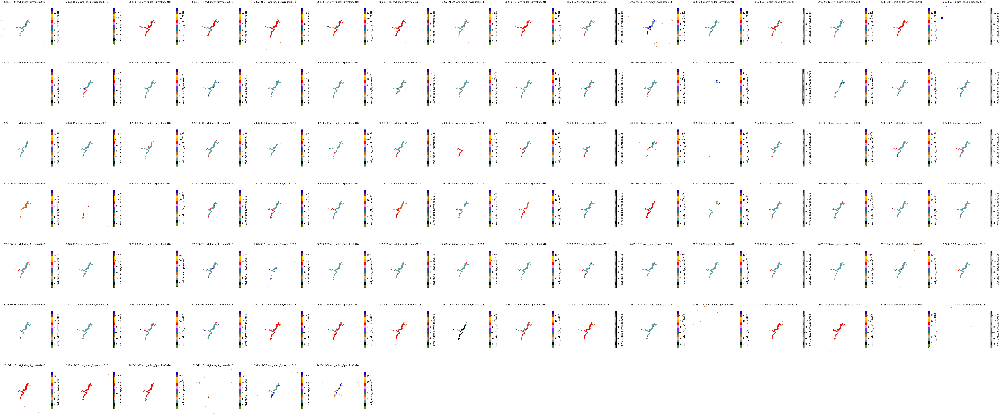

In [18]:
#dcube = dc.datacube
param='owt_index_Spyrakos2018'
ncols=16

colors = ['olivedrab', 'black', 'cadetblue', 'tan', 'chocolate', 'teal', 'blueviolet', 'plum', 'red', 'orange',
          'gold', 'firebrick', 'mediumblue']
cmap_owt = mpl.colors.ListedColormap(colors)

str_epsg = str(dcube.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)
alpha=0.5
dates = dcube.time

Ndates = len(dates)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*7,7*nrows+2.5),subplot_kw={'projection': proj}) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.05, wspace=0.07,)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs=axs.ravel()
[axi.set_axis_off() for axi in axs]

for ii,date in enumerate(dates):
    raster = dcube.sel(time=date)
    if 'time' in raster.dims:
        raster=raster.mean('time')
   
  
    date_ = date.dt.strftime('%Y-%m-%d').values
    #print(date_)
    #dem_attrs = grstbx.Dem.compute_dem_attributes(dem,sza,azi)
    #dem_attrs.shaded.plot.imshow(ax=axs[ii],robust=True,cmap=plt.cm.Greys_r,vmax=0.75,add_colorbar=False)#,cbar_kwargs={'shrink':0.4})
    
    raster[param].where(raster.mask==0).plot.imshow(ax=axs[ii],vmin=0.5,vmax=13.5,cmap=cmap_owt, robust=True,cbar_kwargs={'shrink':0.64})
   
    axs[ii].set_title(date_+' '+param,fontsize=16)


In [19]:
param='owt_index_Spyrakos2018'
owt_dc = dcube[param].where(dcube.mask==0)



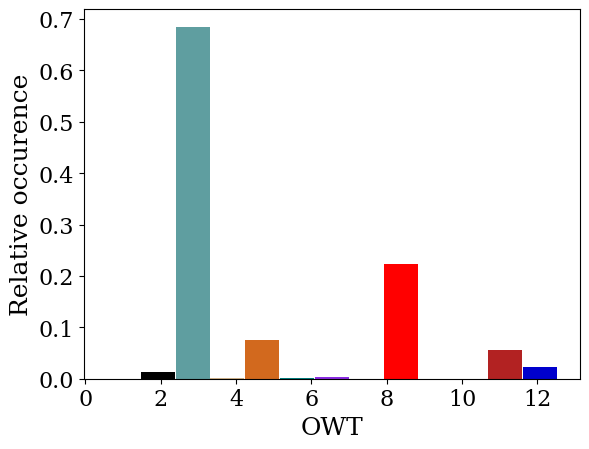

In [39]:
# Get the histogramp
A = owt_dc.values.ravel()
A=A[~np.isnan(A)]
Y,X = np.histogram(A, bins=13,range=[1,13],density=True)


plt.bar(X[:-1],Y,color=colors,width=0.9)
plt.xlabel('OWT')
plt.ylabel('Relative occurence')
plt.show()



Text(0, 0.5, 'OWT index')

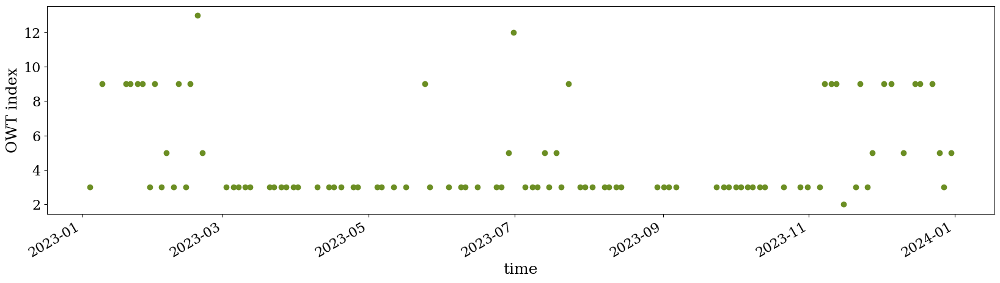

In [47]:
owt_ts = owt_dc.median(['x','y'])
plt.figure(figsize=(20,5))
owt_ts.to_pandas().plot(marker='o',cmap=cmap_owt,lw=0)
plt.ylabel('OWT index')

In [98]:
param='Chla_OC2nasa'
clean_dc = dcube[param].where(dcube.mask==0).where(dcube['owt_index_Spyrakos2018']<13.5).dropna('time',how='all')

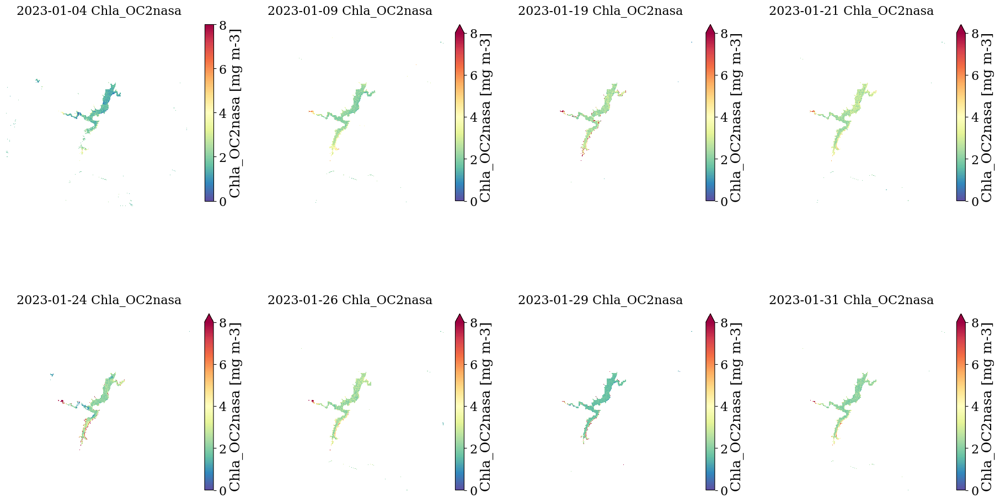

In [99]:

ncols=4


str_epsg = str(dcube.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)
alpha=0.5
dates = clean_dc.isel(time=slice(0,8)).time

Ndates = len(dates)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*5,5*nrows+2.5),subplot_kw={'projection': proj}) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.05, wspace=0.07,)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs=axs.ravel()
[axi.set_axis_off() for axi in axs]

for ii,date in enumerate(dates):
    raster = clean_dc.sel(time=date)
    if 'time' in raster.dims:
        raster=raster.mean('time')
   
  
    date_ = date.dt.strftime('%Y-%m-%d').values
    #print(date_)
    #dem_attrs = grstbx.Dem.compute_dem_attributes(dem,sza,azi)
    #dem_attrs.shaded.plot.imshow(ax=axs[ii],robust=True,cmap=plt.cm.Greys_r,vmax=0.75,add_colorbar=False)#,cbar_kwargs={'shrink':0.4})
    
    raster.plot.imshow(ax=axs[ii],vmin=0,vmax=8,cmap=plt.cm.Spectral_r, robust=True,cbar_kwargs={'shrink':0.64})
   
    axs[ii].set_title(date_+' '+param,fontsize=16)


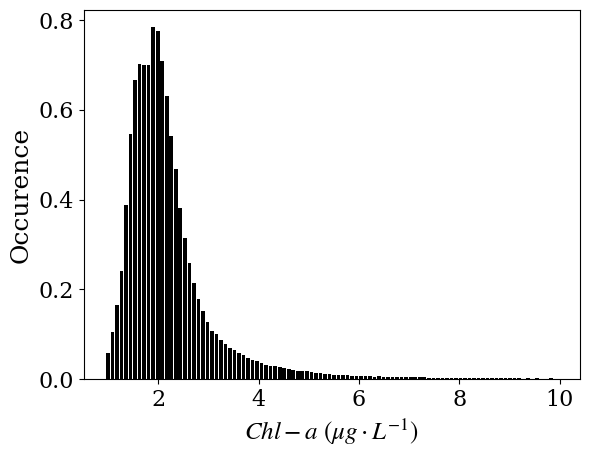

In [100]:
# Get the histogramp
A = clean_dc.values.ravel()
A=A[~np.isnan(A)]
Y,X = np.histogram(A, bins=100,range=[1,10],density=True)


plt.bar(X[:-1],Y,color="k",width=0.8*(X[1]-X[0]))
plt.ylabel('Occurence')
plt.xlabel(r'$Chl-a\ (\mu g\cdot L^{-1})$')
plt.show()


<Axes: xlabel='time', ylabel='$Chl-a\\ (\\mu g\\cdot L^{-1})$'>

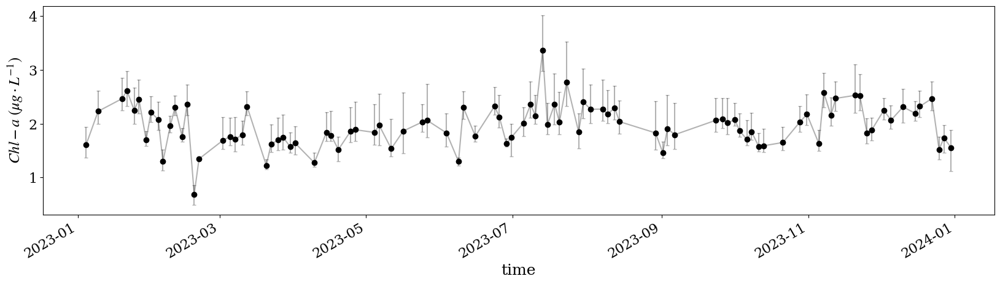

In [101]:
clean_ts = clean_dc.median(['x','y'])
bad_date=clean_ts.where(clean_ts>20,drop=True).time
clean_dc = clean_dc.drop_sel(time=bad_date)
clean_ts = clean_dc.median(['x','y'])
q20=clean_dc.quantile(0.2,['x','y'])

y_errormin=clean_ts-clean_dc.quantile(0.25,['x','y'])
y_errormax=clean_dc.quantile(0.75,['x','y'])-clean_ts
yerr = [y_errormin, y_errormax]

fig, ax = plt.subplots(figsize=(20,5))

ax.set_ylabel(r'$Chl-a\ (\mu g\cdot L^{-1})$')
ax.errorbar(clean_ts.time.values,clean_ts.values,
            yerr=yerr,
            capsize=2,alpha=0.3,c='k')
clean_ts.to_pandas().plot(marker='o',c='k',lw=0,ax=ax)

In [82]:
dcube

<xarray.Dataset> Size: 4GB
Dimensions:                 (time: 102, y: 665, x: 665)
Coordinates:
  * time                    (time) datetime64[ns] 816B 2023-01-04T10:33:29 .....
  * x                       (x) float64 5kB 3.166e+05 3.166e+05 ... 3.298e+05
    band                    int64 8B 1
    spatial_ref             int64 8B 0
  * y                       (y) float64 5kB 4.835e+06 4.835e+06 ... 4.822e+06
Data variables: (12/14)
    owt_dist_Spyrakos2018   (time, y, x) float64 361MB nan nan nan ... nan nan
    owt_index_Spyrakos2018  (time, y, x) float64 361MB nan nan nan ... nan nan
    owt_dist_Bi2024         (time, y, x) float64 361MB nan nan nan ... nan nan
    owt_index_Bi2024        (time, y, x) float64 361MB nan nan nan ... nan nan
    Chla_OC2nasa            (time, y, x) float64 361MB nan nan nan ... nan nan
    Chla_M09B               (time, y, x) float64 361MB nan nan nan ... nan nan
    ...                      ...
    SPM_nechad              (time, y, x) float64 361MB nan nan nan ... nan nan
    acdom_B15               (time, y, x) float64 361MB nan nan nan ... nan nan
    Kd_par                  (time, y, x) float64 361MB nan nan nan ... nan nan
    flags                   (time, y, x) int64 361MB 518 646 646 ... 522 522 514
    mask                    (time, y, x) uint8 45MB 1 1 1 1 1 1 ... 1 1 1 1 1 1
    valid_pix_prop          (time) float64 816B 0.3369 0.02065 ... 0.3865 0.4087
Attributes: (12/74)
    long_name:                           CA BLUE GREEN RED VRE_1 VRE_2 VRE_3 ...
    constellation:                       Sentinel-2
    constellation_id:                    S2
    product_path:                        /data/satellite/Sentinel-2/L1C/32TLP...
    product_name:                        S2B_MSIL1C_20230104T103329_N0509_R10...
    product_filename:                    S2B_MSIL1C_20230104T103329_N0509_R10...
    ...                                  ...
    dirdata:                             /data/grs/grsdata
    abs_gas_file:                        /home/harmel/Dropbox/Dropbox/work/gi...
    water_vapor_transmittance_file:      /home/harmel/Dropbox/Dropbox/work/gi...
    metadata_profile:                    datacube
    start_date:                          2023-01-04T10:33:29.000000000
    stop_date:                           2023-12-30T10:33:49.000000000

In [83]:
param='TURB_dogliotti'
clean_dc = dcube[param].where(dcube.mask==0).where(dcube['owt_index_Spyrakos2018']<13.5).dropna('time',how='all')

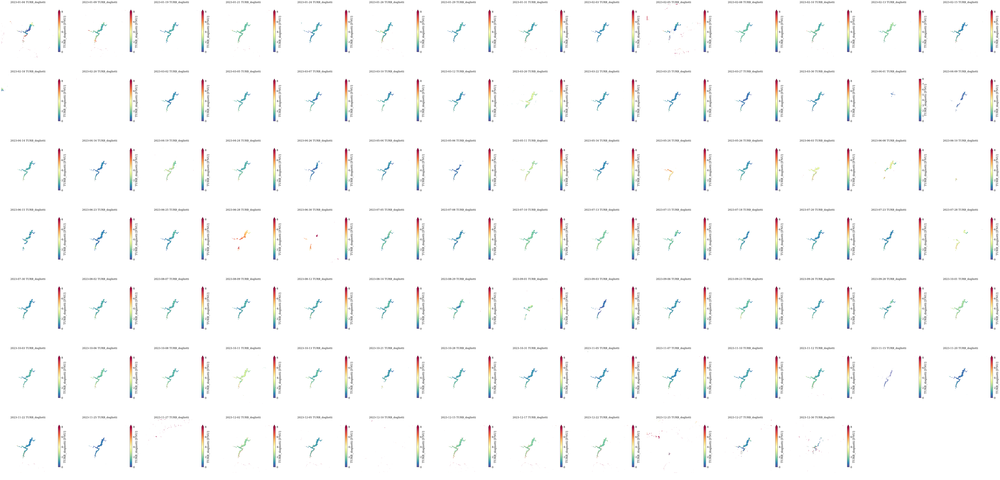

In [84]:

ncols=14


str_epsg = str(dcube.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)
alpha=0.5
dates = clean_dc.time

Ndates = len(dates)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*7,7*nrows+2.5),subplot_kw={'projection': proj}) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.05, wspace=0.07,)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs=axs.ravel()
[axi.set_axis_off() for axi in axs]

for ii,date in enumerate(dates):
    raster = clean_dc.sel(time=date)
    if 'time' in raster.dims:
        raster=raster.mean('time')
   
  
    date_ = date.dt.strftime('%Y-%m-%d').values
    #print(date_)
    #dem_attrs = grstbx.Dem.compute_dem_attributes(dem,sza,azi)
    #dem_attrs.shaded.plot.imshow(ax=axs[ii],robust=True,cmap=plt.cm.Greys_r,vmax=0.75,add_colorbar=False)#,cbar_kwargs={'shrink':0.4})
    
    raster.plot.imshow(ax=axs[ii],vmin=0,vmax=8,cmap=plt.cm.Spectral_r, robust=True,cbar_kwargs={'shrink':0.64})
   
    axs[ii].set_title(date_+' '+param,fontsize=16)


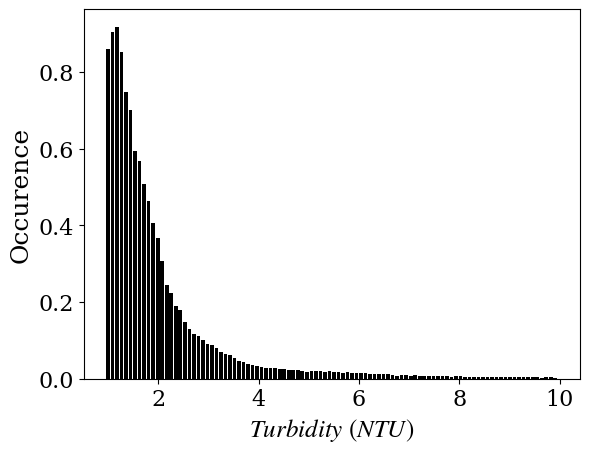

In [88]:
# Get the histogramp
A = clean_dc.values.ravel()
A=A[~np.isnan(A)]
Y,X = np.histogram(A, bins=100,range=[1,10],density=True)


plt.bar(X[:-1],Y,color="k",width=0.8*(X[1]-X[0]))
plt.ylabel('Occurence')
plt.xlabel(r'$Turbidity\ (NTU)$')
plt.show()


<Axes: xlabel='time', ylabel='$Turbidity\\ (NTU)$'>

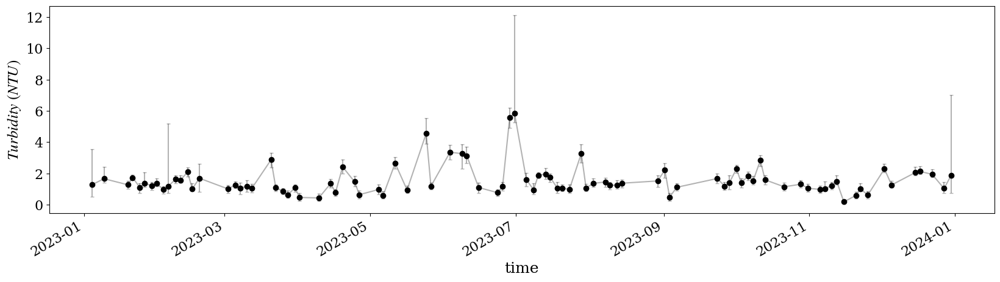

In [96]:
clean_ts = clean_dc.median(['x','y'])
bad_date=clean_ts.where(clean_ts>8,drop=True).time
clean_dc = clean_dc.drop_sel(time=bad_date)
clean_ts = clean_dc.median(['x','y'])
q20=clean_dc.quantile(0.2,['x','y'])

y_errormin=clean_ts-clean_dc.quantile(0.25,['x','y'])
y_errormax=clean_dc.quantile(0.75,['x','y'])-clean_ts
yerr = [y_errormin, y_errormax]

fig, ax = plt.subplots(figsize=(20,5))

ax.set_ylabel(r'$Turbidity\ (NTU)$')
ax.errorbar(clean_ts.time.values,clean_ts.values,
            yerr=yerr,
            capsize=2,alpha=0.3,c='k')
clean_ts.to_pandas().plot(marker='o',c='k',lw=0,ax=ax)

In [41]:
dcube=dcube.drop_duplicates('time')

In [12]:
v=visual.ViewParam(dcube,reproject=True)
v.minmax=[0,0.1]
v.visu()

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Row
                    [0] Markdown(str)
                    [1] Select(options=['owt_dist_Spyrakos2018', ...], value='owt_dist_Spyrakos2018')
                [1] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2023, ...], start=datetime.date(2023, 1, 4), value=datetime.date(2023, 1, 4))
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='CartoDark')
            [1] Row
                [0] EditableRangeSlider(end=0.1, name='Range Slider', step=0.0001, value=(0, 4), width=300)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
        [2] HoloViews(DynamicMap, height=800, sizing_mode='fixed', width=1200)

In [43]:
geom_ = v.get_geom(v.aoi_stream,crs=dcube.rio.crs)

dc_clipped = dcube.where(dcube.mask==0).rio.clip(geom_.geometry.values).drop_duplicates('time')

In [45]:

# TODO adapt for L2B

stacked = Rrs_clipped.sel(wl=slice(400,1000)).dropna('time',thresh=0).stack(gridcell=["y", "x"]).dropna('gridcell',thresh=0).compute()
Npix_tot = len(stacked.gridcell)

group_coord ='wl'

stat_coord='gridcell'
time=stacked.time
date=time.dt.floor('1D')
stats = xr.Dataset({'Rrs_median':stacked.groupby(group_coord).median(stat_coord)},
                  coords={'date':date})
stats['Rrs_q25'] = stacked.groupby(group_coord).quantile(0.25,dim=stat_coord)
stats['Rrs_q75'] = stacked.groupby(group_coord).quantile(0.75,dim=stat_coord)
stats['Rrs_min'] = stacked.groupby(group_coord).min(stat_coord)
stats['Rrs_max'] = stacked.groupby(group_coord).max(stat_coord)
stats['Rrs_mean'] = stacked.groupby(group_coord).mean(stat_coord)
stats['Rrs_std'] = stacked.groupby(group_coord).std(stat_coord)
stats['sza'] = dcube.sza.mean('x').mean('y')
stats['aot550'] = dcube.aot550.mean('x').mean('y')
stats['pix_num'] = stacked.count(stat_coord)
stats['rel_pix_num'] =  stats['pix_num'] / Npix_tot
stats['time'] = time
sat_matchup=stats.swap_dims({'time':'date'}).reset_coords('time')